In [27]:
import pandas as pd
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
import missingno as msno

In [11]:
books = pd.read_csv('./code/data/books.csv')
train = pd.read_csv('./code/data/train_ratings.csv')
test = pd.read_csv('./code/data/test_ratings.csv')
users = pd.read_csv('./code/data/users.csv')


In [37]:
books.head(2)

,isbn,book_title,book_author,year_of_publication,publisher,img_url,language,category,summary,img_path
0,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,en,['Actresses'],"In a small town in Canada, Clara Callan reluct...",images/0002005018.01.THUMBZZZ.jpg
1,0060973129,Decision in Normandy,Carlo D'Este,1991.0,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,en,['1940-1949'],"Here, for the first time in paperback, is an o...",images/0060973129.01.THUMBZZZ.jpg


In [38]:
train.head(2)

,user_id,isbn,rating
0,8,0002005018,4
1,67544,0002005018,7


In [39]:
users.head(2)

,user_id,location,age
0,8,"timmins, ontario, canada",NaN
1,11400,"ottawa, ontario, canada",49.0


# 1. books

In [12]:
books

,isbn,book_title,book_author,year_of_publication,publisher,img_url,language,category,summary,img_path
0,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,en,['Actresses'],"In a small town in Canada, Clara Callan reluct...",images/0002005018.01.THUMBZZZ.jpg
1,0060973129,Decision in Normandy,Carlo D'Este,1991.0,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,en,['1940-1949'],"Here, for the first time in paperback, is an o...",images/0060973129.01.THUMBZZZ.jpg
2,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999.0,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,en,['Medical'],"Describes the great flu epidemic of 1918, an o...",images/0374157065.01.THUMBZZZ.jpg
3,0399135782,The Kitchen God's Wife,Amy Tan,1991.0,Putnam Pub Group,http://images.amazon.com/images/P/0399135782.0...,en,['Fiction'],A Chinese immigrant who is convinced she is dy...,images/0399135782.01.THUMBZZZ.jpg
4,0425176428,What If?: The World's Foremost Military Histor...,Robert Cowley,2000.0,Berkley Publishing Group,http://images.amazon.com/images/P/0425176428.0...,en,['History'],"Essays by respected military historians, inclu...",images/0425176428.01.THUMBZZZ.jpg
...,...,...,...,...,...,...,...,...,...,...
149565,067161746X,The Bachelor Home Companion: A Practical Guide...,P.J. O'Rourke,1987.0,Pocket Books,http://images.amazon.com/images/P/067161746X.0...,en,['Humor'],A tongue-in-cheek survival guide for single pe...,images/067161746X.01.THUMBZZZ.jpg
149566,0767907566,All Elevations Unknown: An Adventure in the He...,Sam Lightner,2001.0,Broadway Books,http://images.amazon.com/images/P/0767907566.0...,en,['Nature'],A daring twist on the travel-adventure genre t...,images/0767907566.01.THUMBZZZ.jpg
149567,0884159221,Why stop?: A guide to Texas historical roadsid...,Claude Dooley,1985.0,Lone Star Books,http://images.amazon.com/images/P/0884159221.0...,NaN,NaN,NaN,images/0884159221.01.THUMBZZZ.jpg
149568,0912333022,The Are You Being Served? Stories: 'Camping In...,Jeremy Lloyd,1997.0,Kqed Books,http://images.amazon.com/images/P/0912333022.0...,en,['Fiction'],These hilarious stories by the creator of publ...,images/0912333022.01.THUMBZZZ.jpg


In [13]:
books.columns

Index(['isbn', 'book_title', 'book_author', 'year_of_publication', 'publisher',
       'img_url', 'language', 'category', 'summary', 'img_path'],
      dtype='object')

In [14]:
books.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149570 entries, 0 to 149569
Data columns (total 10 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   isbn                 149570 non-null  object 
 1   book_title           149570 non-null  object 
 2   book_author          149569 non-null  object 
 3   year_of_publication  149570 non-null  float64
 4   publisher            149570 non-null  object 
 5   img_url              149570 non-null  object 
 6   language             82343 non-null   object 
 7   category             80719 non-null   object 
 8   summary              82343 non-null   object 
 9   img_path             149570 non-null  object 
dtypes: float64(1), object(9)
memory usage: 11.4+ MB


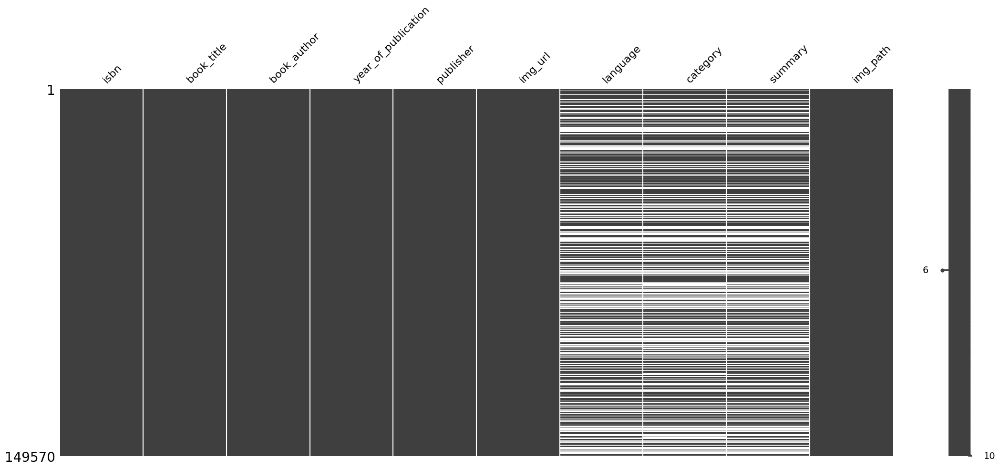

In [15]:
msno.matrix(books)
plt.show()

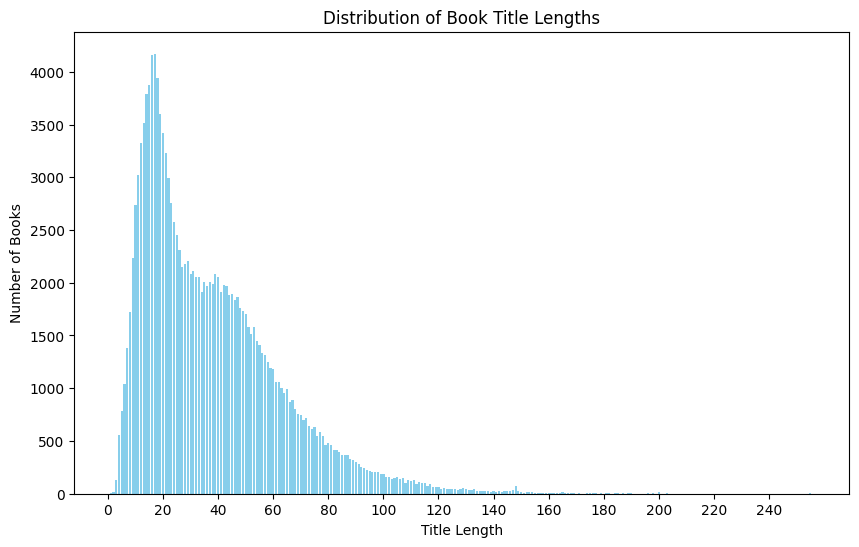

In [ ]:
# 제목 길이
title_lengths = [len(i) for i in books['book_title']]

length_counts = Counter(title_lengths)

plt.figure(figsize=(10, 6))
plt.bar(length_counts.keys(), length_counts.values(), color='skyblue')
plt.xlabel('Title Length')
plt.ylabel('Number of Books')
plt.title('Distribution of Book Title Lengths')
plt.xticks(range(0, max(length_counts.keys()) + 1, 20))
plt.show()


In [22]:
(Counter(books['book_author']))

Counter({'Stephen King': 446,
         'Agatha Christie': 404,
         'William Shakespeare': 381,
         'Barbara Cartland': 283,
         'Nora Roberts': 241,
         'Terry Pratchett': 198,
         'Isaac Asimov': 195,
         'Charles Dickens': 187,
         'Carolyn Keene': 185,
         'Ann M. Martin': 183,
         'Piers Anthony': 166,
         'Marion Zimmer Bradley': 163,
         'Not Applicable (Na )': 163,
         'R. L. Stine': 162,
         'Jane Austen': 161,
         'Mary Higgins Clark': 156,
         'Mark Twain': 153,
         'Francine Pascal': 152,
         'J. R. R. Tolkien': 151,
         'Roald Dahl': 150,
         'Anne McCaffrey': 146,
         'Nathaniel Hawthorne': 140,
         'John Steinbeck': 138,
         'Diana Palmer': 133,
         'Dick Francis': 132,
         'Tom Clancy': 128,
         'Danielle Steel': 126,
         'L. Frank Baum': 126,
         'Sandra Brown': 108,
         'John Grisham': 107,
         'James A. Michener': 107,
      

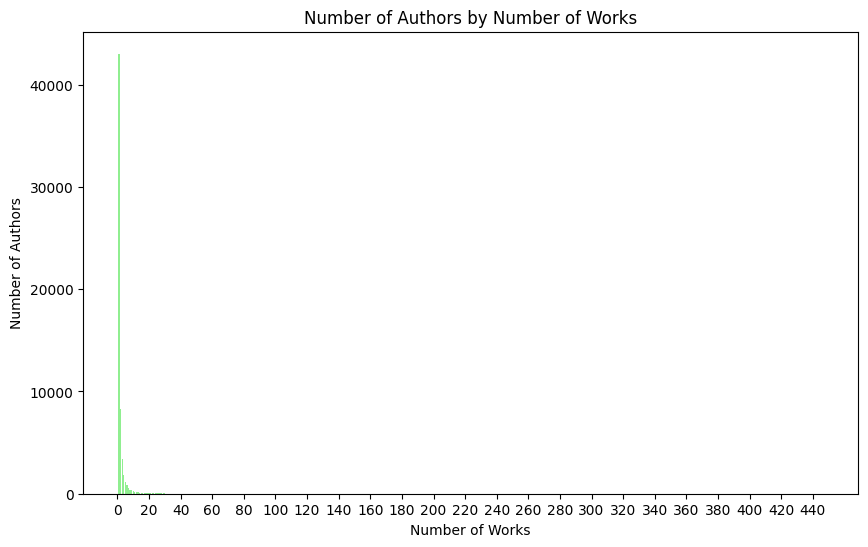

In [26]:
# 저자별 작품 개수 계산
author_counts = Counter(books['book_author'].dropna().astype(str))

# 작품 개수에 따른 작가 수 계산
works_per_author = Counter(author_counts.values())

# 작품 수와 그에 해당하는 작가 수 리스트로 변환
works, author_count = zip(*sorted(works_per_author.items()))

# 분포 시각화
plt.figure(figsize=(10, 6))
plt.bar(works, author_count, color='lightgreen')
plt.xlabel('Number of Works')
plt.ylabel('Number of Authors')
plt.title('Number of Authors by Number of Works')

# 20 단위로 x축 눈금 표시
plt.xticks(range(0, max(works) + 1, 20))
plt.show()


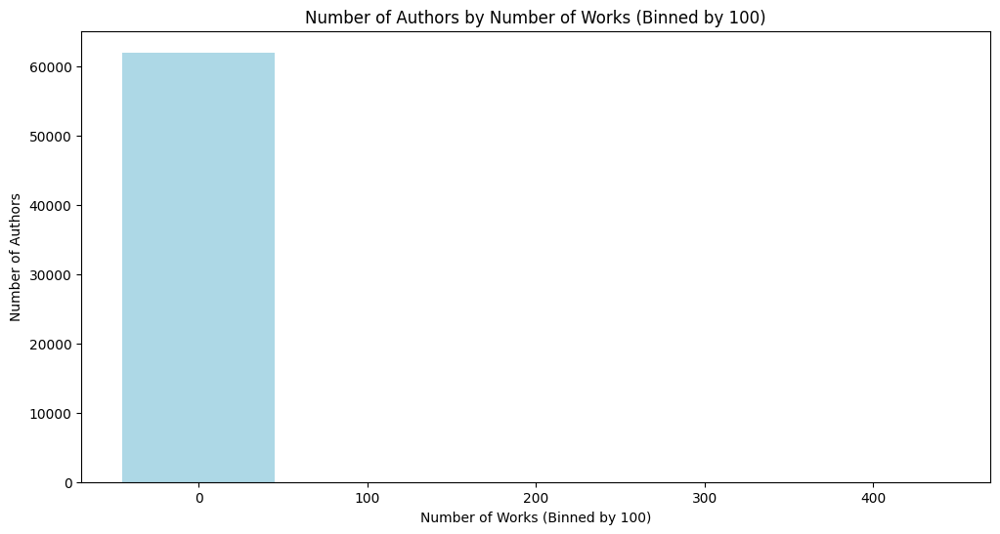

In [ ]:
# 저자별 작품 개수 계산
author_counts = Counter(books['book_author'].dropna().astype(str))

# 작품 개수에 따른 작가 수 계산
works_per_author = Counter(author_counts.values())

# 100 단위로 범주화
bins = np.arange(0, max(works_per_author.keys()) + 100, 100)  
binned_author_counts = Counter()

for work_count in works_per_author:
    # 현재 작품 수에 해당하는 범주에 작가 수를 추가
    bin_index = (work_count // 100) * 100
    binned_author_counts[bin_index] += works_per_author[work_count]

binned_works, binned_authors = zip(*sorted(binned_author_counts.items()))

# 분포 시각화
plt.figure(figsize=(12, 6))
plt.bar(binned_works, binned_authors, width=90, color='lightblue')  
plt.xlabel('Number of Works (Binned by 100)')
plt.ylabel('Number of Authors')
plt.title('Number of Authors by Number of Works (Binned by 100)')
plt.xticks(binned_works) 
plt.show()


In [29]:
binned_author_counts

Counter({0: 62024, 100: 29, 400: 2, 200: 2, 300: 1})

In [36]:
set(books['year_of_publication'])
# 1376년부터 2006년까지 있음.

{1376.0,
 1378.0,
 1806.0,
 1900.0,
 1901.0,
 1902.0,
 1904.0,
 1906.0,
 1908.0,
 1911.0,
 1920.0,
 1923.0,
 1924.0,
 1925.0,
 1926.0,
 1927.0,
 1928.0,
 1929.0,
 1930.0,
 1931.0,
 1932.0,
 1933.0,
 1934.0,
 1935.0,
 1936.0,
 1937.0,
 1938.0,
 1939.0,
 1940.0,
 1941.0,
 1942.0,
 1943.0,
 1944.0,
 1945.0,
 1946.0,
 1947.0,
 1948.0,
 1949.0,
 1950.0,
 1951.0,
 1952.0,
 1953.0,
 1954.0,
 1955.0,
 1956.0,
 1957.0,
 1958.0,
 1959.0,
 1960.0,
 1961.0,
 1962.0,
 1963.0,
 1964.0,
 1965.0,
 1966.0,
 1967.0,
 1968.0,
 1969.0,
 1970.0,
 1971.0,
 1972.0,
 1973.0,
 1974.0,
 1975.0,
 1976.0,
 1977.0,
 1978.0,
 1979.0,
 1980.0,
 1981.0,
 1982.0,
 1983.0,
 1984.0,
 1985.0,
 1986.0,
 1987.0,
 1988.0,
 1989.0,
 1990.0,
 1991.0,
 1992.0,
 1993.0,
 1994.0,
 1995.0,
 1996.0,
 1997.0,
 1998.0,
 1999.0,
 2000.0,
 2001.0,
 2002.0,
 2003.0,
 2004.0,
 2005.0,
 2006.0}

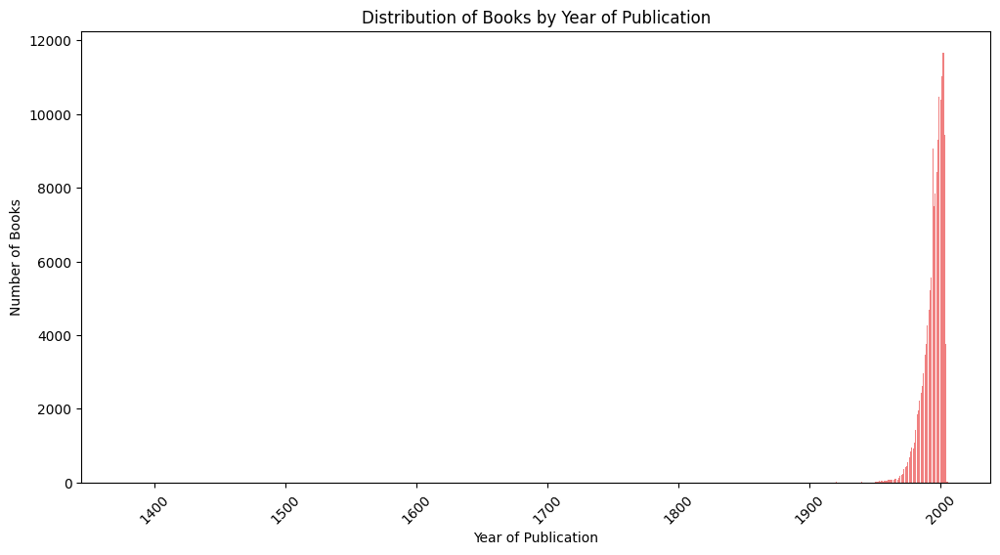

In [ ]:
# 출판 연도별 책 개수 계산
year_counts = Counter(books['year_of_publication'].dropna().astype(int))

# 출판 연도와 책 개수 리스트로 변환
years, counts = zip(*sorted(year_counts.items()))

# 분포 시각화
plt.figure(figsize=(12, 6))
plt.bar(years, counts, color='lightcoral')
plt.xlabel('Year of Publication')
plt.ylabel('Number of Books')
plt.title('Distribution of Books by Year of Publication')
plt.xticks(rotation=45) 
plt.show()

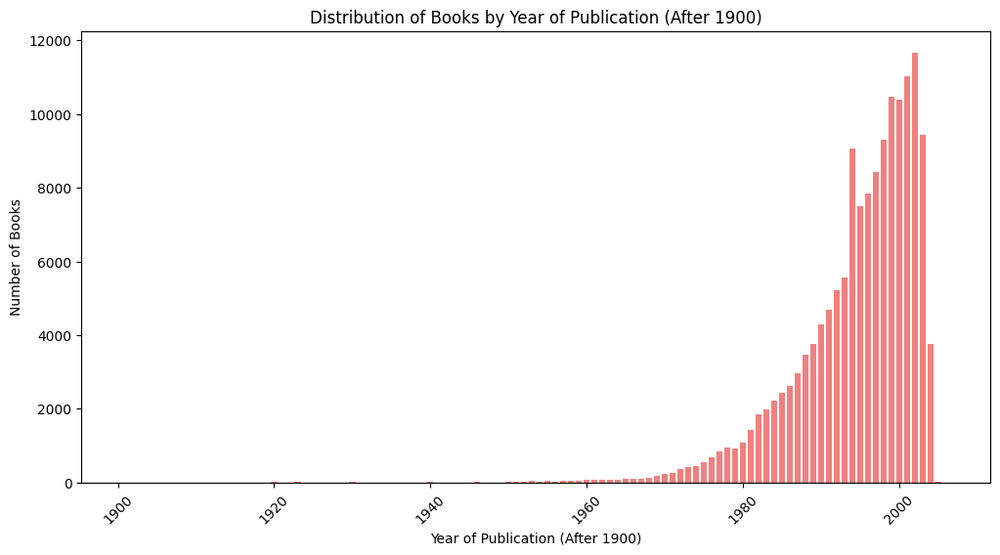

In [34]:
# 출판 연도 필터링 (1900년 이후)
filtered_years = books['year_of_publication'].dropna().astype(int)
filtered_years = filtered_years[filtered_years > 1900]

# 출판 연도별 책 개수 계산
year_counts = Counter(filtered_years)

# 출판 연도와 책 개수 리스트로 변환
years, counts = zip(*sorted(year_counts.items()))

# 분포 시각화
plt.figure(figsize=(12, 6))
plt.bar(years, counts, color='lightcoral')
plt.xlabel('Year of Publication (After 1900)')
plt.ylabel('Number of Books')
plt.title('Distribution of Books by Year of Publication (After 1900)')
plt.xticks(rotation=45)  # x축 레이블 회전
plt.show()


In [ ]:
print(books['language'].isna().sum()/len(books))
## 44%가 na 값임.

0.449468476298723


In [42]:
books['language'].value_counts()

language
en       78823
de        1282
es        1017
fr         883
it         123
nl          67
pt          47
da          37
ca          23
ms          10
no           6
zh-CN        3
la           3
ru           3
ja           3
gl           3
ro           1
el           1
th           1
fa           1
eo           1
gd           1
ga           1
vi           1
zh-TW        1
ko           1
Name: count, dtype: int64

In [49]:
print(len(books[books['language']=='en'])/len(books['language'].dropna()))
## na 제외 95%가 영어다. -> na 값을 영어로 채워도 될까?


0.957251982560752


In [51]:
books['category']

0         ['Actresses']
1         ['1940-1949']
2           ['Medical']
3           ['Fiction']
4           ['History']
              ...      
149565        ['Humor']
149566       ['Nature']
149567              NaN
149568      ['Fiction']
149569              NaN
Name: category, Length: 149570, dtype: object

In [53]:
print(books['category'].isna().sum()/len(books))
# 46퍼가 nan

0.4603262686367587


In [ ]:
# 카테고리 열을 해체
exploded_categories = books.explode('category')

# 각 카테고리의 등장 횟수 계산
category_counts = exploded_categories['category'].value_counts()

# 결과를 리스트 형태로 변환
category_counts_list = category_counts.reset_index()
category_counts_list.columns = ['Category', 'Count']  # 열 이름 지정

# 결과 출력
print(category_counts_list)

                             Category  Count
0                         ['Fiction']  32956
1                ['Juvenile Fiction']   5804
2       ['Biography & Autobiography']   3320
3                         ['History']   1925
4                        ['Religion']   1818
...                               ...    ...
4287                     ['Disguise']      1
4288              ['Country lawyers']      1
4289  ['Humorous stories, Brazilian']      1
4290                       ['Coasts']      1
4291          ['Vocational guidance']      1

[4292 rows x 2 columns]


In [70]:
len(category_counts_list[category_counts_list['Count']<5]) / len(category_counts_list)
# 87%의 카테고리가 5번 이하로 등장함

0.8765144454799627

In [ ]:
len(category_counts_list[category_counts_list['Count']<2]) / len(category_counts_list)
# 1번 등장하는 카테고리가 63%다. -> 문제가 있음..

0.6314072693383038

In [ ]:
# 'category' 열에서 모든 카테고리를 소문자로 변환
category_counts_list['Category'] = category_counts_list['Category'].str.lower()

# 'omputer'가 포함된 카테고리 필터링
filtered_categories = category_counts_list[category_counts_list['Category'].str.contains('omputer', na=False)]

# 결과 출력
print(len(filtered_categories))
print(filtered_categories.head(5))
print(filtered_categories.tail(5))

# 컴퓨터 관련 카테고리만 51개임 => 통합할 필요가 있다. => 어떻게? 몰라...

51
                                 Category  Count
13                          ['computers']    730
196                 ['computer networks']     13
447                    ['microcomputers']      5
486              ['macintosh (computer)']      5
497  ['java (computer program language)']      5
                                 Category  Count
4252    ['operating systems (computers)']      1
4254  ['asp (computer network protocol)']      1
4276       ['computer software industry']      1
4279             ['unix (computer file)']      1
4286   ['c# (computer program language)']      1


In [81]:
books['summary'].isna().sum()/len(books)

0.449468476298723

In [89]:
[summary for summary in books['summary']]

['In a small town in Canada, Clara Callan reluctantly takes leave of her\nsister, Nora, who is bound for New York.',
 'Here, for the first time in paperback, is an outstanding military\nhistory that offers a dramatic new perspective on the Allied campaign\nthat began with the invasion of the D-Day beaches of Normandy. Nationa\nadvertising in Military History.',
 'Describes the great flu epidemic of 1918, an outbreak that killed some\nforty million people worldwide, and discusses the efforts of\nscientists and public health officials to understand and prevent\nanother lethal pandemic',
 'A Chinese immigrant who is convinced she is dying threatens to\ncelebrate the Chinese New Year by unburdening herself of\neverybody&#39;s hidden truths, thus prompting a series of comic\nmisunderstandings',
 'Essays by respected military historians, including Stephen Ambrose,\nDavid McCullough, James McPherson, and John Keegan, consider the\nconsequences if history had turned out differently, such as if

In [90]:
# 각 요약의 단어 수 계산
word_counts = [len(summary.split()) for summary in books['summary'].dropna()]

# 결과 출력
print(word_counts)


[21, 38, 33, 30, 37, 22, 10, 28, 28, 32, 24, 28, 13, 18, 35, 37, 41, 20, 33, 23, 21, 34, 27, 30, 43, 24, 35, 39, 13, 32, 33, 36, 37, 34, 36, 44, 22, 26, 26, 32, 14, 28, 17, 27, 41, 42, 43, 29, 40, 14, 38, 35, 38, 13, 35, 14, 19, 17, 34, 10, 22, 31, 17, 30, 27, 35, 43, 40, 29, 27, 18, 32, 25, 26, 30, 27, 40, 35, 37, 32, 20, 15, 39, 37, 21, 32, 45, 20, 24, 29, 35, 39, 38, 48, 44, 41, 16, 11, 4, 21, 42, 33, 12, 24, 28, 27, 17, 34, 8, 9, 31, 19, 41, 33, 18, 26, 22, 35, 41, 42, 22, 6, 17, 38, 10, 33, 42, 43, 38, 25, 18, 26, 43, 10, 13, 42, 27, 38, 37, 33, 34, 29, 23, 21, 21, 32, 22, 33, 32, 41, 24, 32, 34, 24, 39, 35, 41, 38, 25, 41, 36, 10, 43, 17, 25, 33, 40, 42, 43, 36, 33, 20, 17, 33, 36, 29, 39, 12, 33, 20, 36, 38, 38, 10, 35, 32, 15, 43, 27, 29, 38, 29, 23, 39, 37, 45, 22, 42, 28, 33, 37, 30, 21, 24, 45, 32, 15, 15, 16, 16, 16, 15, 15, 16, 15, 18, 14, 34, 21, 27, 39, 40, 31, 32, 19, 22, 27, 24, 17, 7, 34, 16, 36, 40, 27, 41, 20, 40, 36, 14, 17, 31, 25, 18, 30, 37, 34, 35, 16, 31, 18, 

In [91]:
import nltk
import re
from nltk.corpus import stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /data/ephemeral/home/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [96]:

# 불용어 리스트 가져오기
stop_words = set(stopwords.words('english'))

# 각 요약의 단어 수 계산
def count_words(summary):
    # 특수문자 제거 및 소문자로 변환
    summary_cleaned = re.sub(r'[^a-zA-Z\s]', '', summary.lower())
    
    # 단어 리스트로 변환 후 불용어 제거
    words = [word for word in summary_cleaned.split() if word not in stop_words]
    
    return len(words)

# 각 요약의 단어 수 계산
word_counts = [count_words(summary) for summary in books['summary'].dropna()]

# 결과 출력
print(word_counts)


[13, 21, 21, 18, 21, 16, 7, 17, 17, 16, 12, 16, 10, 13, 20, 18, 19, 10, 19, 14, 14, 18, 15, 16, 19, 24, 19, 18, 8, 17, 21, 19, 19, 17, 24, 21, 14, 15, 15, 18, 7, 20, 11, 14, 16, 38, 24, 17, 23, 9, 19, 22, 20, 6, 20, 8, 13, 12, 22, 7, 13, 29, 17, 20, 19, 24, 24, 21, 17, 14, 13, 18, 11, 15, 20, 18, 22, 20, 20, 22, 12, 10, 23, 20, 13, 19, 17, 10, 16, 15, 22, 20, 20, 20, 25, 26, 16, 9, 4, 18, 40, 20, 6, 12, 16, 14, 8, 17, 5, 7, 20, 12, 20, 20, 11, 15, 18, 19, 23, 18, 21, 6, 15, 23, 6, 17, 22, 23, 24, 15, 10, 14, 26, 7, 8, 25, 15, 22, 21, 15, 21, 18, 13, 13, 14, 21, 14, 20, 23, 25, 16, 19, 20, 15, 22, 20, 28, 20, 14, 24, 24, 8, 19, 10, 16, 22, 20, 27, 22, 19, 22, 11, 9, 24, 24, 15, 23, 7, 23, 9, 23, 20, 21, 8, 21, 18, 10, 22, 19, 14, 25, 17, 15, 20, 19, 21, 12, 21, 19, 19, 23, 18, 12, 17, 26, 18, 8, 8, 8, 8, 7, 8, 8, 7, 8, 8, 7, 17, 15, 19, 21, 23, 17, 20, 13, 14, 13, 15, 8, 3, 20, 11, 23, 21, 17, 20, 11, 24, 16, 7, 10, 16, 16, 12, 17, 20, 21, 19, 9, 16, 10, 21, 16, 15, 14, 11, 22, 3, 19, 1

In [97]:
# 각 요약의 남은 단어 리스트 반환
def get_remaining_words(summary):
    # 특수문자 제거 및 소문자로 변환
    summary_cleaned = re.sub(r'[^a-zA-Z\s]', '', summary.lower())
    
    # 단어 리스트로 변환 후 불용어 제거
    remaining_words = [word for word in summary_cleaned.split() if word not in stop_words]
    
    return remaining_words

# 각 요약의 남은 단어 리스트 생성
remaining_words_lists = [get_remaining_words(summary) for summary in books['summary'].dropna()]

# 결과 출력
for i, remaining_words in enumerate(remaining_words_lists):
    print(f"Summary {i + 1}: {remaining_words}")

Summary 1: ['small', 'town', 'canada', 'clara', 'callan', 'reluctantly', 'takes', 'leave', 'sister', 'nora', 'bound', 'new', 'york']
Summary 2: ['first', 'time', 'paperback', 'outstanding', 'military', 'history', 'offers', 'dramatic', 'new', 'perspective', 'allied', 'campaign', 'began', 'invasion', 'dday', 'beaches', 'normandy', 'nationa', 'advertising', 'military', 'history']
Summary 3: ['describes', 'great', 'flu', 'epidemic', 'outbreak', 'killed', 'forty', 'million', 'people', 'worldwide', 'discusses', 'efforts', 'scientists', 'public', 'health', 'officials', 'understand', 'prevent', 'another', 'lethal', 'pandemic']
Summary 4: ['chinese', 'immigrant', 'convinced', 'dying', 'threatens', 'celebrate', 'chinese', 'new', 'year', 'unburdening', 'everybodys', 'hidden', 'truths', 'thus', 'prompting', 'series', 'comic', 'misunderstandings']
Summary 5: ['essays', 'respected', 'military', 'historians', 'including', 'stephen', 'ambrose', 'david', 'mccullough', 'james', 'mcpherson', 'john', 'kee

In [98]:
books

,isbn,book_title,book_author,year_of_publication,publisher,img_url,language,category,summary,img_path
0,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,en,['Actresses'],"In a small town in Canada, Clara Callan reluct...",images/0002005018.01.THUMBZZZ.jpg
1,0060973129,Decision in Normandy,Carlo D'Este,1991.0,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,en,['1940-1949'],"Here, for the first time in paperback, is an o...",images/0060973129.01.THUMBZZZ.jpg
2,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999.0,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,en,['Medical'],"Describes the great flu epidemic of 1918, an o...",images/0374157065.01.THUMBZZZ.jpg
3,0399135782,The Kitchen God's Wife,Amy Tan,1991.0,Putnam Pub Group,http://images.amazon.com/images/P/0399135782.0...,en,['Fiction'],A Chinese immigrant who is convinced she is dy...,images/0399135782.01.THUMBZZZ.jpg
4,0425176428,What If?: The World's Foremost Military Histor...,Robert Cowley,2000.0,Berkley Publishing Group,http://images.amazon.com/images/P/0425176428.0...,en,['History'],"Essays by respected military historians, inclu...",images/0425176428.01.THUMBZZZ.jpg
...,...,...,...,...,...,...,...,...,...,...
149565,067161746X,The Bachelor Home Companion: A Practical Guide...,P.J. O'Rourke,1987.0,Pocket Books,http://images.amazon.com/images/P/067161746X.0...,en,['Humor'],A tongue-in-cheek survival guide for single pe...,images/067161746X.01.THUMBZZZ.jpg
149566,0767907566,All Elevations Unknown: An Adventure in the He...,Sam Lightner,2001.0,Broadway Books,http://images.amazon.com/images/P/0767907566.0...,en,['Nature'],A daring twist on the travel-adventure genre t...,images/0767907566.01.THUMBZZZ.jpg
149567,0884159221,Why stop?: A guide to Texas historical roadsid...,Claude Dooley,1985.0,Lone Star Books,http://images.amazon.com/images/P/0884159221.0...,NaN,NaN,NaN,images/0884159221.01.THUMBZZZ.jpg
149568,0912333022,The Are You Being Served? Stories: 'Camping In...,Jeremy Lloyd,1997.0,Kqed Books,http://images.amazon.com/images/P/0912333022.0...,en,['Fiction'],These hilarious stories by the creator of publ...,images/0912333022.01.THUMBZZZ.jpg
